In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
pd.set_option('display.max_columns',None)

# 1.Data Ingestion:

In [4]:
dataframe = pd.read_csv('online_shoppers_intention_given.csv')

In [5]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
Administrative             12330 non-null int64
Administrative_Duration    12330 non-null float64
Informational              12330 non-null int64
Informational_Duration     12330 non-null float64
ProductRelated             12330 non-null int64
ProductRelated_Duration    12330 non-null float64
BounceRates                12330 non-null float64
ExitRates                  12330 non-null float64
PageValues                 12330 non-null float64
SpecialDay                 12330 non-null float64
Month                      12330 non-null object
OperatingSystems           12330 non-null int64
Browser                    12330 non-null int64
Region                     12330 non-null int64
TrafficType                12330 non-null int64
VisitorType                12330 non-null object
Weekend                    12330 non-null bool
Revenue                    12330 non-null bool
dtypes: bool(

## Checking Null Values

In [6]:
dataframe.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [7]:
dataframe.isna().any()

Administrative             False
Administrative_Duration    False
Informational              False
Informational_Duration     False
ProductRelated             False
ProductRelated_Duration    False
BounceRates                False
ExitRates                  False
PageValues                 False
SpecialDay                 False
Month                      False
OperatingSystems           False
Browser                    False
Region                     False
TrafficType                False
VisitorType                False
Weekend                    False
Revenue                    False
dtype: bool

In [8]:
dataframe.sample(5)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
1388,3,134.000000,0,0.0,53,1659.319697,0.000000,0.003801,62.348137,0.0,Mar,4,1,1,2,Returning_Visitor,False,True
4656,2,15.000000,0,0.0,38,1880.966667,0.003704,0.023810,12.597667,0.0,May,4,1,1,4,Returning_Visitor,True,True
944,11,267.166667,0,0.0,39,881.441667,0.004167,0.011458,20.117513,0.0,Mar,2,2,3,1,New_Visitor,False,False
10919,1,3.000000,0,0.0,161,3763.447588,0.001667,0.012346,0.000000,0.0,Nov,1,1,1,2,Returning_Visitor,False,True
2954,0,0.000000,0,0.0,26,810.371377,0.019231,0.025305,0.000000,0.8,May,3,2,3,1,Returning_Visitor,False,False


## Checking Duplicated rows

In [9]:
dataframe.duplicated().any()

True

In [10]:
dataframe[dataframe.duplicated()== True].head(10)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
158,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,1,1,1,3,Returning_Visitor,False,False
159,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,3,2,3,3,Returning_Visitor,False,False
178,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,3,2,3,3,Returning_Visitor,False,False
418,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Mar,1,1,1,1,Returning_Visitor,True,False
456,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Mar,2,2,4,1,Returning_Visitor,False,False
483,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Mar,3,2,3,1,Returning_Visitor,False,False
512,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Mar,2,2,1,1,Returning_Visitor,False,False
540,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Mar,3,2,3,1,Returning_Visitor,False,False
554,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Mar,2,2,1,1,Returning_Visitor,False,False
589,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Mar,2,2,1,1,Returning_Visitor,False,False


In [11]:
dataframe.duplicated().value_counts()

False    12205
True       125
dtype: int64

125 rows are repeated or duplicated. So, i will drop duplicated rows

In [12]:
dataframe.shape

(12330, 18)

In [13]:
dataframe.drop_duplicates(keep='first',inplace=True)

In [14]:
dataframe.shape # now data set is free from bissness

(12205, 18)

In [15]:
dataframe.sample(10)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
5736,0,0.0,0,0.0,36,1083.751630,0.006667,0.011684,0.000000,0.0,June,1,1,3,2,Returning_Visitor,False,False
11505,0,0.0,0,0.0,40,3998.333333,0.002439,0.041870,0.000000,0.0,Nov,4,2,4,1,Returning_Visitor,False,False
7455,2,28.2,0,0.0,16,312.200000,0.033333,0.048148,0.000000,0.0,Oct,2,2,1,1,Returning_Visitor,False,False
3967,4,120.0,4,64.0,52,1859.083333,0.010345,0.018391,17.248701,0.0,May,2,2,2,13,Returning_Visitor,False,True
6960,3,49.4,0,0.0,11,285.600000,0.000000,0.021429,0.000000,0.0,Oct,2,2,7,2,Returning_Visitor,False,False
3448,5,119.0,0,0.0,49,1143.348504,0.000000,0.008595,0.000000,0.0,May,1,1,1,2,Returning_Visitor,False,False
4125,0,0.0,0,0.0,9,237.333333,0.000000,0.031667,0.000000,0.0,May,1,1,1,3,Returning_Visitor,False,False
7159,0,0.0,1,0.0,20,581.500000,0.015000,0.051667,0.000000,0.0,Sep,2,2,1,1,Returning_Visitor,False,False
3885,0,0.0,0,0.0,31,887.916667,0.038710,0.069892,0.000000,0.6,May,1,1,1,15,Returning_Visitor,False,False
4830,0,0.0,0,0.0,11,161.000000,0.000000,0.018182,0.000000,0.0,May,2,2,1,1,Returning_Visitor,False,False


In [16]:
dataframe.select_dtypes('object').columns

Index(['Month', 'VisitorType'], dtype='object')

In [17]:
dataframe.select_dtypes(exclude='object').columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Weekend',
       'Revenue'],
      dtype='object')

In [18]:
dataframe['SpecialDay'].unique()

array([0. , 0.4, 0.8, 1. , 0.2, 0.6])

In [19]:
dataframe['Month'].unique()

array(['Feb', 'Mar', 'May', 'Oct', 'June', 'Jul', 'Aug', 'Nov', 'Sep',
       'Dec'], dtype=object)

In [20]:
dataframe['Month'].value_counts()

May     3329
Nov     2982
Mar     1860
Dec     1706
Oct      549
Sep      448
Aug      433
Jul      432
June     285
Feb      181
Name: Month, dtype: int64

In [21]:
dataframe['VisitorType'].unique()

array(['Returning_Visitor', 'New_Visitor', 'Other'], dtype=object)

In [22]:
dataframe['VisitorType'].value_counts()

Returning_Visitor    10431
New_Visitor           1693
Other                   81
Name: VisitorType, dtype: int64

## Inserting Other with mode of a categorical column

In [23]:
dataframe['VisitorType'] = dataframe['VisitorType'].str.replace('Other', dataframe['VisitorType'].mode()[0])

In [24]:
dataframe['VisitorType'].value_counts()

Returning_Visitor    10512
New_Visitor           1693
Name: VisitorType, dtype: int64

In [25]:
dataframe['Revenue'].unique()

array([False,  True])

In [26]:
dataframe['Revenue'].value_counts()

False    10297
True      1908
Name: Revenue, dtype: int64

In [27]:
dataframe['Weekend'].unique()

array([False,  True])

In [28]:
dataframe['Weekend'].value_counts()

False    9346
True     2859
Name: Weekend, dtype: int64

## Changing datatypes

In [29]:
# astype('category')

In [30]:
dataframe['Weekend'] = dataframe['Weekend'].astype(int).astype('category')

In [31]:
dataframe['Revenue'] = dataframe['Revenue'].astype(int).astype('category')

In [32]:
dataframe['Region'] = dataframe['Region'].astype('category')

In [33]:
dataframe['Browser'] = dataframe['Browser'].astype('category')

In [34]:
dataframe['OperatingSystems'] = dataframe['OperatingSystems'].astype('category')

In [35]:
dataframe['TrafficType'] = dataframe['TrafficType'].astype('category')

In [36]:
dataframe.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,1,0


In [37]:
from sklearn.preprocessing import LabelEncoder

In [38]:
LR = LabelEncoder()

In [39]:
dataframe['Month'] = LR.fit_transform(dataframe['Month'])

In [40]:
#dataframe = dataframe.join(pd.get_dummies(dataframe['Month']))

In [41]:
#ataframe.drop('Month', axis=1, inplace= True)

In [42]:
dataframe['Month'] = dataframe['Month'].astype('category')

In [43]:
dataframe.tail()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,1,4,6,1,1,Returning_Visitor,1,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,7,3,2,1,8,Returning_Visitor,1,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,7,3,2,1,13,Returning_Visitor,1,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,7,2,2,3,11,Returning_Visitor,0,0
12329,0,0.0,0,0.0,3,21.250000,0.000000,0.066667,0.000000,0.0,7,3,2,1,2,New_Visitor,1,0


In [47]:
dataframe['VisitorType'] = LR.fit_transform(dataframe['VisitorType']).astype('object')

In [48]:
dataframe.tail()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,1,4,6,1,1,1,1,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,7,3,2,1,8,1,1,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,7,3,2,1,13,1,1,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,7,2,2,3,11,1,0,0
12329,0,0.0,0,0.0,3,21.250000,0.000000,0.066667,0.000000,0.0,7,3,2,1,2,0,1,0


In [49]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12205 entries, 0 to 12329
Data columns (total 18 columns):
Administrative             12205 non-null int64
Administrative_Duration    12205 non-null float64
Informational              12205 non-null int64
Informational_Duration     12205 non-null float64
ProductRelated             12205 non-null int64
ProductRelated_Duration    12205 non-null float64
BounceRates                12205 non-null float64
ExitRates                  12205 non-null float64
PageValues                 12205 non-null float64
SpecialDay                 12205 non-null float64
Month                      12205 non-null category
OperatingSystems           12205 non-null category
Browser                    12205 non-null category
Region                     12205 non-null category
TrafficType                12205 non-null category
VisitorType                12205 non-null object
Weekend                    12205 non-null category
Revenue                    12205 non-null 

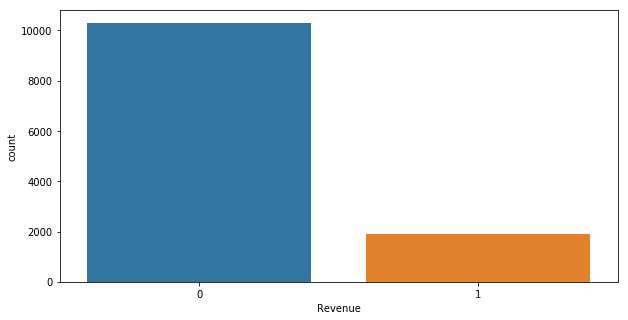

In [50]:
plt.figure(figsize=(10,5))
sns.countplot(dataframe['Revenue'])

In [51]:
dataframe['Revenue'].value_counts()

0    10297
1     1908
Name: Revenue, dtype: int64

In [52]:
dataframe.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,2,1,1,1,1,1,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,2,2,2,1,2,1,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,2,4,1,9,3,1,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,2,3,2,2,4,1,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,2,3,3,1,4,1,1,0


In [53]:
dataframe.select_dtypes(exclude=object).columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Weekend',
       'Revenue'],
      dtype='object')

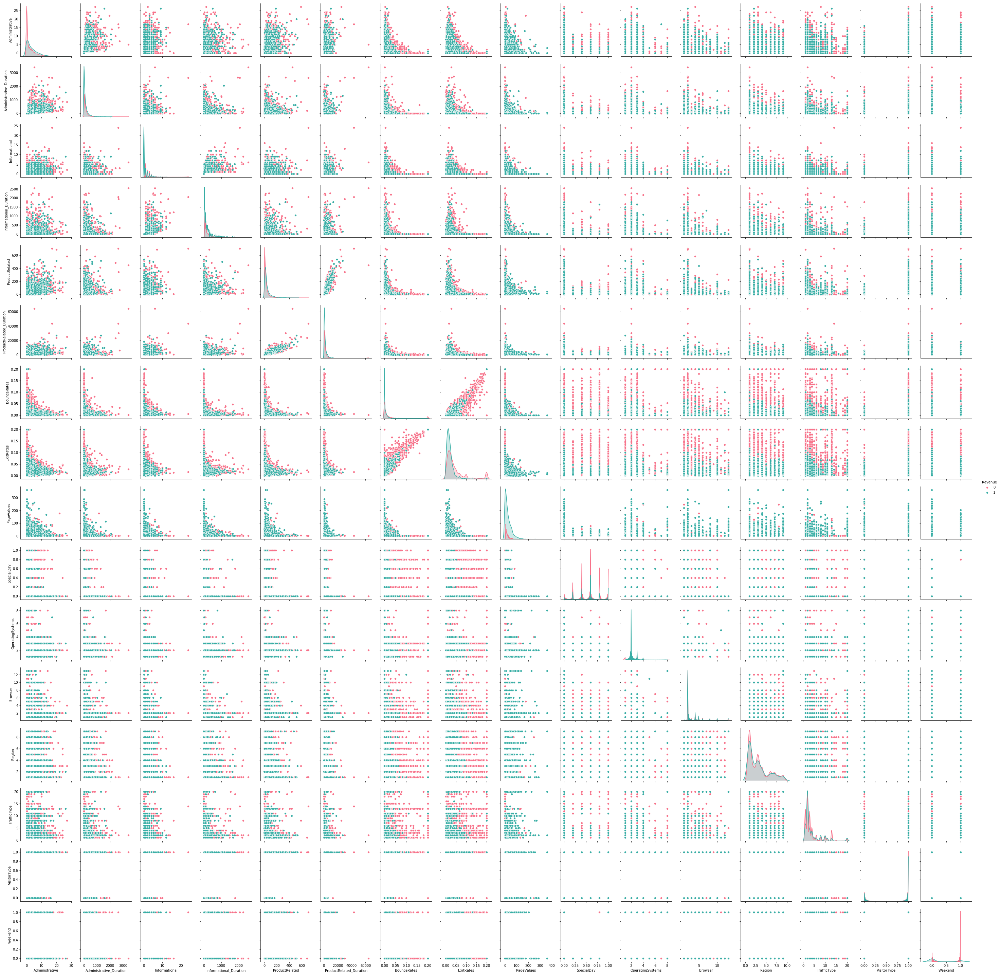

In [54]:
sns.pairplot(dataframe, vars=['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend'], hue='Revenue', palette='husl');

In [55]:
Class_label = dataframe.pop('Revenue')

In [56]:
from scipy.stats import zscore

In [57]:
dataframe_scaled = dataframe.apply(zscore)

In [58]:
# dataframe_scaled = dataframe.select_dtypes(exclude=object).apply(zscore).join(dataframe.select_dtypes(object))

In [59]:
dataframe_scaled.sample(5)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
3788,-0.101756,-0.309772,-0.398824,-0.246257,2.847032,0.363981,-0.359229,-0.607372,0.472288,-0.310240,0.350448,-0.136980,-0.209237,0.768741,-0.516347,0.401315,-0.553088
3415,-0.702302,-0.460019,-0.398824,-0.246257,-0.651367,-0.614727,1.759633,2.712281,-0.318962,3.696611,0.350448,-1.239776,-0.794017,-0.896370,-0.765321,0.401315,-0.553088
529,-0.402029,-0.420579,-0.398824,-0.246257,-0.628941,-0.605350,-0.450137,-0.627493,-0.318962,-0.310240,-0.070787,0.965816,-0.209237,-0.063814,-0.765321,0.401315,-0.553088
10032,-0.402029,-0.314936,3.521009,2.950508,0.043828,-0.132008,-0.450137,-0.658441,0.154853,-0.310240,-1.755725,-0.136980,-0.209237,-0.063814,-0.516347,0.401315,-0.553088
6779,0.198517,-0.112665,5.088943,2.447561,1.568771,0.947271,-0.138503,-0.469349,0.293908,-0.310240,1.614152,0.965816,-0.209237,-0.896370,-0.516347,0.401315,-0.553088


# Kmeans:

In [60]:
from sklearn.cluster import KMeans

In [61]:
cluster_range = range(1, 10)
cluster_errors = []
for num_cluster in cluster_range:
    model = KMeans(num_cluster)
    model.fit(dataframe_scaled)
    cluster_errors.append(model.inertia_)

In [62]:
cluster_errors

[207484.99999999878,
 184002.57470335864,
 165053.59848592407,
 153009.29742193906,
 144762.20411372968,
 135992.00456207668,
 130516.59862075237,
 123553.66904807485,
 118464.49509309996]

In [63]:
clusters_df = pd.DataFrame({'num_clusters': cluster_range, 'Inertia':cluster_errors})

clusters_df

,num_clusters,Inertia
0,1,207485.000000
1,2,184002.574703
2,3,165053.598486
3,4,153009.297422
4,5,144762.204114
5,6,135992.004562
6,7,130516.598621
7,8,123553.669048
8,9,118464.495093


## Elbow graph which plots error vs number of clusters

Text(0, 0.5, 'cluster_errors')

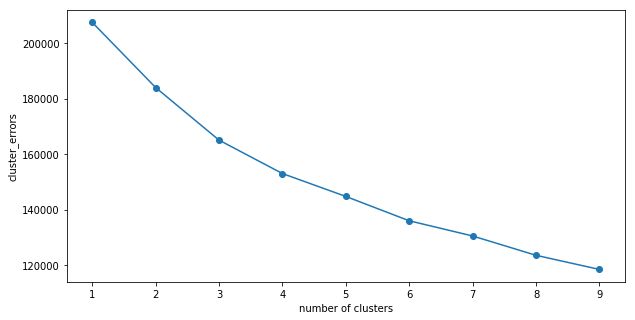

In [64]:
plt.figure(figsize=(10,5))
plt.plot(clusters_df.num_clusters, clusters_df.Inertia, marker='o')
plt.xlabel('number of clusters')
plt.ylabel('cluster_errors')

In [65]:
for i in range(0,len(cluster_errors)-1):
    print(i+1,':',cluster_errors[i] - cluster_errors[i+1])

1 : 23482.42529664014
2 : 18948.976217434567
3 : 12044.30106398501
4 : 8247.093308209383
5 : 8770.199551653
6 : 5475.4059413243085
7 : 6962.929572677516
8 : 5089.173954974889


## Number of clusters is optimized cluster using elbow graph

### KMean with 2 number of clusters

In [66]:
model = KMeans(n_clusters=2, n_init=15, random_state=2)

In [67]:
model.fit(dataframe_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=15, n_jobs=None, precompute_distances='auto',
       random_state=2, tol=0.0001, verbose=0)

In [68]:
centroid_kmean = model.cluster_centers_

In [69]:
centroid_kmean

array([[-0.27300613, -0.22316536, -0.2588547 , -0.198858  , -0.24870204,
        -0.2317081 ,  0.05940437,  0.09124826, -0.04105614,  0.02997763,
        -0.02981685,  0.00370432,  0.01604691,  0.01229283,  0.02173259,
        -0.04247887, -0.00750638],
       [ 1.44100613,  1.177932  ,  1.36631076,  1.04963065,  1.31272203,
         1.22302303, -0.31355364, -0.481635  ,  0.21670632, -0.15823071,
         0.15738203, -0.01955247, -0.0847003 , -0.06488517, -0.11471098,
         0.22421588,  0.03962086]])

In [70]:
centroid_df_kmean = pd.DataFrame(centroid_kmean, columns=dataframe_scaled.columns)

In [71]:
centroid_df_kmean

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
0,-0.273006,-0.223165,-0.258855,-0.198858,-0.248702,-0.231708,0.059404,0.091248,-0.041056,0.029978,-0.029817,0.003704,0.016047,0.012293,0.021733,-0.042479,-0.007506
1,1.441006,1.177932,1.366311,1.049631,1.312722,1.223023,-0.313554,-0.481635,0.216706,-0.158231,0.157382,-0.019552,-0.084700,-0.064885,-0.114711,0.224216,0.039621


In [72]:
model.inertia_

184002.6587270492

## Creating a new dataframe only for labels and converting it into categorical variable2

In [73]:
df_labels_kmean = pd.DataFrame(model.labels_ , columns = list(['labels']))
df_labels_kmean['labels'] = df_labels_kmean['labels'].astype('category')

In [74]:
df_labels_kmean['labels'].value_counts()

0    10261
1     1944
Name: labels, dtype: int64

#  Hierarchical:

In [75]:
from scipy.cluster.hierarchy import linkage, dendrogram

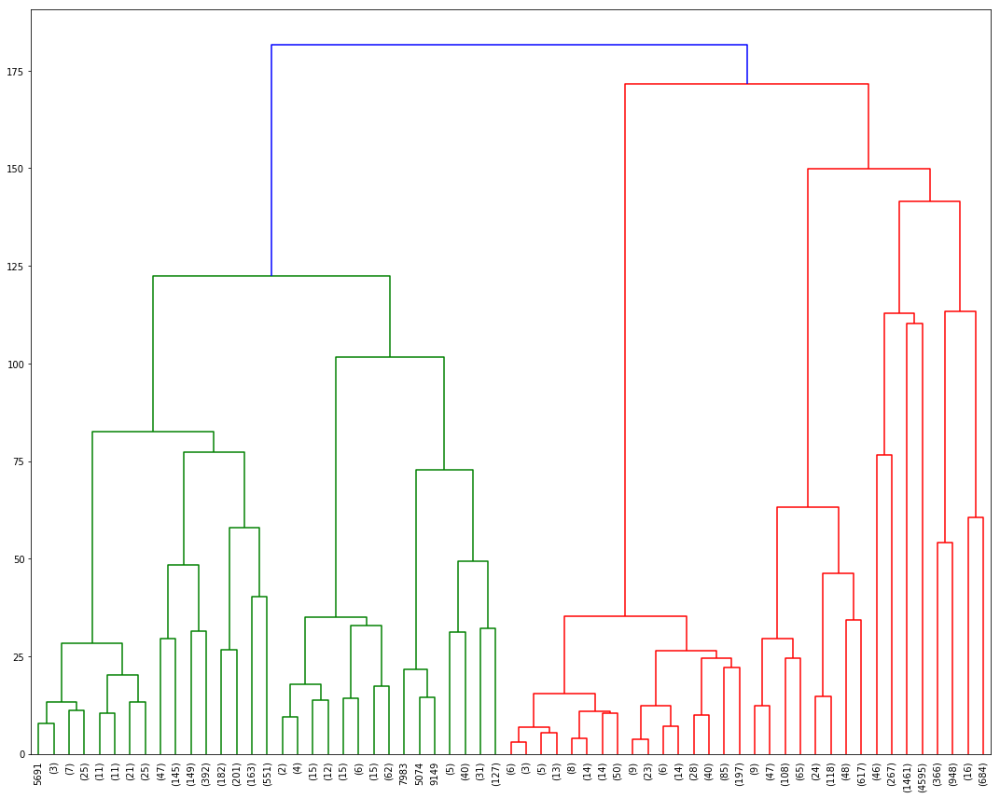

In [76]:
plt.figure(figsize=(15, 12))
a = linkage(dataframe_scaled, 'ward')
dendrogram(a,leaf_rotation=90.0,p=5,color_threshold=175,leaf_font_size=10,truncate_mode='level')
plt.tight_layout()

In [77]:
from sklearn.cluster import AgglomerativeClustering

In [78]:
agglo_model = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')

In [79]:
dataframe_scaled.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
0,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,-1.239776,-0.794017,-0.896370,-0.765321,0.401315,-0.553088
1,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.595451,-0.450137,1.268054,-0.318962,-0.31024,-1.334491,-0.136980,-0.209237,-0.896370,-0.516347,0.401315,-0.553088
2,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,2.068612,-0.794017,2.433853,-0.267374,0.401315,-0.553088
3,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.627404,0.654748,2.134590,-0.318962,-0.31024,-1.334491,0.965816,-0.209237,-0.480092,-0.018400,0.401315,-0.553088
4,-0.702302,-0.460019,-0.398824,-0.246257,-0.494387,-0.301889,-0.008183,0.184884,-0.318962,-0.31024,-1.334491,0.965816,0.375543,-0.896370,-0.018400,0.401315,1.808031


In [80]:
agglo_model.fit(dataframe_scaled)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=2,
                        pooling_func='deprecated')

In [81]:
agglo_model.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [82]:
df_labels_agglo = pd.DataFrame(agglo_model.labels_ , columns = list(['labels']))
df_labels_agglo['labels'] = df_labels_agglo['labels'].astype('category')

In [83]:
df_labels_agglo['labels'].value_counts()

0    9934
1    2271
Name: labels, dtype: int64

# 4. Convert Unsupervised data into Supervised data:

In [84]:
b = dataframe_scaled.join(df_labels_agglo)
b.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,labels
0,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,-1.239776,-0.794017,-0.896370,-0.765321,0.401315,-0.553088,0
1,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.595451,-0.450137,1.268054,-0.318962,-0.31024,-1.334491,-0.136980,-0.209237,-0.896370,-0.516347,0.401315,-0.553088,0
2,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,2.068612,-0.794017,2.433853,-0.267374,0.401315,-0.553088,0
3,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.627404,0.654748,2.134590,-0.318962,-0.31024,-1.334491,0.965816,-0.209237,-0.480092,-0.018400,0.401315,-0.553088,0
4,-0.702302,-0.460019,-0.398824,-0.246257,-0.494387,-0.301889,-0.008183,0.184884,-0.318962,-0.31024,-1.334491,0.965816,0.375543,-0.896370,-0.018400,0.401315,1.808031,0


In [85]:
df_clust = b.groupby(['labels'])

In [86]:
df0 = df_clust.get_group(0)
df1 = df_clust.get_group(1)
print(df0.shape)
print(df1.shape)

(9829, 18)
(2251, 18)


In [87]:
b.shape

(12205, 18)

In [88]:
c0 = np.mean(df0.iloc[:,0:18]).values
c0

array([-0.0016444 , -0.00060889, -0.00161652, -0.00036911, -0.00877853,
       -0.00580962,  0.00076755,  0.00120027,  0.00148821,  0.02067518,
        0.00644032,  0.00259472, -0.00064596, -0.01023921, -0.00426575,
        0.00218298, -0.00634808,  0.        ])

In [89]:
c1 = np.mean(df1.iloc[:,0:18]).values
c1

array([ 1.17637120e-02,  8.23805241e-03,  8.30911642e-03,  2.76463608e-03,
        3.01891413e-02,  1.79465450e-02,  3.38948559e-03, -5.98717739e-04,
       -9.54495579e-03, -7.30503854e-02, -1.25886257e-02, -1.94005055e-02,
       -3.74540145e-03,  4.39998107e-02,  2.13072981e-02, -1.25384762e-02,
        2.38180015e-02,  1.00000000e+00])

In [90]:
id0 = 0
id1 = 0 

In [91]:
for i in range(0, len(df0)):
    id0 = id0 + np.sum((df0.iloc[i:i+1,0:18].values - c0)**2)
for i in range(0, len(df1)):
    id1 = id1 + np.sum((df1.iloc[i:i+1,0:18].values - c1)**2)
print(id0)
print(id1)
print('Inertia for the AgglomerativeClustering is',id0+id1)

166855.59631337805
38646.21900405392
Inertia for the AgglomerativeClustering is 205501.81531743196


Inertia of Kmeans is less then Agglomerative so, the Kmeans classifed data in good way with less miss classification compair to it.

# PCA

In [92]:
dataframe_scaled.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
0,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,-1.239776,-0.794017,-0.896370,-0.765321,0.401315,-0.553088
1,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.595451,-0.450137,1.268054,-0.318962,-0.31024,-1.334491,-0.136980,-0.209237,-0.896370,-0.516347,0.401315,-0.553088
2,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,2.068612,-0.794017,2.433853,-0.267374,0.401315,-0.553088
3,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.627404,0.654748,2.134590,-0.318962,-0.31024,-1.334491,0.965816,-0.209237,-0.480092,-0.018400,0.401315,-0.553088
4,-0.702302,-0.460019,-0.398824,-0.246257,-0.494387,-0.301889,-0.008183,0.184884,-0.318962,-0.31024,-1.334491,0.965816,0.375543,-0.896370,-0.018400,0.401315,1.808031


In [93]:
# dataframe['Weekend'] = dataframe['Weekend'].astype(int).astype(object)

# dataframe['Revenue'] = dataframe['Revenue'].astype(int).astype(object)

# dataframe['Region'] = dataframe['Region'].astype(object)

# dataframe['Browser'] = dataframe['Browser'].astype(object)

# dataframe['OperatingSystems'] = dataframe['OperatingSystems'].astype(object)

# dataframe['TrafficType'] = dataframe['TrafficType'].astype(object)

In [94]:
dataframe_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12205 entries, 0 to 12329
Data columns (total 17 columns):
Administrative             12205 non-null float64
Administrative_Duration    12205 non-null float64
Informational              12205 non-null float64
Informational_Duration     12205 non-null float64
ProductRelated             12205 non-null float64
ProductRelated_Duration    12205 non-null float64
BounceRates                12205 non-null float64
ExitRates                  12205 non-null float64
PageValues                 12205 non-null float64
SpecialDay                 12205 non-null float64
Month                      12205 non-null float64
OperatingSystems           12205 non-null float64
Browser                    12205 non-null float64
Region                     12205 non-null float64
TrafficType                12205 non-null float64
VisitorType                12205 non-null object
Weekend                    12205 non-null float64
dtypes: float64(16), object(1)
memory usag

In [95]:
np.cov(dataframe_scaled.select_dtypes(exclude=object)).shape

(12205, 12205)

In [96]:
dataframe_scaled.select_dtypes(exclude=object).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,541,542,543,544,545,546,547,548,549,550,551,552,553,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,948,949,950,951,952,953,954,955,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1024,1025,1026,1027,1028,1029,1030,1031,1032,1033,1035,1036,1037,1038,

In [97]:
np.cov(dataframe_scaled.select_dtypes(exclude=object).T).shape

(16, 16)

In [98]:
covariance_matrix = np.cov(dataframe_scaled.select_dtypes(exclude=object).T)

# Eigenvalues and Eigenvectors

In [99]:
eigen_value , eigen_vectors = np.linalg.eig(covariance_matrix)

In [100]:
eigen_value

array([3.391933  , 1.69981382, 0.08671392, 0.12382473, 0.35232877,
       0.4224826 , 1.38144225, 1.13659467, 0.75888509, 0.84419091,
       0.87376772, 1.04434164, 1.02378108, 0.93343442, 0.95355475,
       0.97422166])

In [101]:
eigen_value.shape

(16,)

In [102]:
eigen_vectors.shape

(16, 16)

In [103]:
total = sum(eigen_value)

In [104]:
total

16.00131104555885

In [105]:
sorted(eigen_value, reverse=True)

[3.3919330002296375,
 1.6998138197422705,
 1.3814422483936244,
 1.1365946677351848,
 1.044341640688289,
 1.023781084089484,
 0.9742216605728966,
 0.9535547518319655,
 0.9334344194476122,
 0.8737677170871766,
 0.8441909096676166,
 0.7588850943698686,
 0.4224826042442356,
 0.35232877296914306,
 0.12382473264556554,
 0.08671392184427898]

In [106]:
# Percintile of Eigen_value
eigen_value_per = [(i/total)*100 for i in sorted(eigen_value, reverse=True)]

In [107]:
eigen_value_per

[21.19784429270916,
 10.622965923870671,
 8.63330663631492,
 7.103134640024672,
 6.526600462392393,
 6.398107512406827,
 6.088386494076002,
 5.959228897663506,
 5.833487123585952,
 5.460600788269097,
 5.275760887742514,
 4.742643225978014,
 2.6402999294329406,
 2.2018744087031017,
 0.7738411702204425,
 0.5419176066097806]

In [108]:
cumulative_per = np.cumsum(eigen_value_per)

In [109]:
# cumulative variance holde in data set in percentage
cumulative_per

array([ 21.19784429,  31.82081022,  40.45411685,  47.55725149,
        54.08385196,  60.48195947,  66.57034596,  72.52957486,
        78.36306198,  83.82366277,  89.09942366,  93.84206689,
        96.48236681,  98.68424122,  99.45808239, 100.        ])

In [110]:
# Eigen vectors
eigen_value

array([3.391933  , 1.69981382, 0.08671392, 0.12382473, 0.35232877,
       0.4224826 , 1.38144225, 1.13659467, 0.75888509, 0.84419091,
       0.87376772, 1.04434164, 1.02378108, 0.93343442, 0.95355475,
       0.97422166])

In [111]:
eigen_vectors

array([[ 3.81411196e-01,  5.40986994e-02, -3.04760512e-02,
        -1.67753136e-01,  4.46472751e-01,  5.80958289e-01,
         3.60635253e-02, -1.05444937e-01,  1.78201762e-02,
         5.57316685e-02, -1.53798538e-01, -1.59054578e-01,
         3.99303913e-01, -2.18447645e-01,  1.10781725e-01,
         3.80493921e-02],
       [ 3.28256475e-01,  1.06927615e-01, -2.57331727e-02,
         1.45692869e-01, -3.05385929e-01, -5.63653212e-01,
         4.23786372e-02, -1.47129439e-01, -1.49593382e-02,
         7.51754872e-02, -2.09847558e-01, -1.91601636e-01,
         4.78101835e-01, -2.93288917e-01,  1.48639042e-01,
         3.46611551e-02],
       [ 3.48081741e-01,  2.71982378e-01,  4.70645361e-03,
        -2.84295401e-02, -6.31363931e-01,  3.92091411e-01,
        -3.11301398e-02, -1.90790042e-01,  1.72660363e-02,
         3.53958860e-02,  7.36488037e-02, -1.46291231e-01,
        -3.53083458e-01,  3.69513134e-03,  1.60233205e-01,
        -1.88615393e-01],
       [ 2.96444200e-01,  2.92320859e

In [112]:
eigen_value[5]

0.4224826042442356

In [113]:
eigen_vectors[:,5]

array([ 0.58095829, -0.56365321,  0.39209141, -0.36107203,  0.10708191,
       -0.20403111,  0.06883659,  0.00505139, -0.02226629,  0.01703643,
       -0.01946225, -0.01876376,  0.03094951, -0.00509183,  0.01318984,
       -0.01183038])

In [114]:
len(eigen_vectors)

16

In [115]:
eigen_pair = [(eigen_value[index], eigen_vectors[:, index]) for index in range(len(eigen_vectors))]

In [116]:
eigen_pair

[(3.3919330002296375,
  array([ 0.3814112 ,  0.32825647,  0.34808174,  0.2964442 ,  0.41121143,
          0.41302963, -0.27173792, -0.32108122,  0.09143709, -0.07601453,
          0.04280942, -0.01560038, -0.02008877, -0.02492676, -0.05469864,
          0.029637  ])),
 (1.6998138197422705,
  array([ 0.0540987 ,  0.10692761,  0.27198238,  0.29232086,  0.15420895,
          0.19380173,  0.60471512,  0.57354449, -0.18030678,  0.13535684,
          0.02185946,  0.03895007, -0.03635925, -0.0427321 ,  0.11035792,
         -0.04568268])),
 (0.08671392184427898,
  array([-0.03047605, -0.02573317,  0.00470645, -0.01036681, -0.18001003,
          0.1344575 ,  0.66774569, -0.70682864, -0.0399536 ,  0.01859771,
         -0.00678354, -0.00809622,  0.0097245 , -0.00587522, -0.00182663,
         -0.01094463])),
 (0.12382473264556554,
  array([-0.16775314,  0.14569287, -0.02842954,  0.0777135 ,  0.66702439,
         -0.67228208,  0.15385202, -0.15149579, -0.00626572, -0.0102021 ,
         -0.00338606,

In [117]:
eigen_pair.sort()
eigen_pair.reverse()

In [118]:
eigen_pair

[(3.3919330002296375,
  array([ 0.3814112 ,  0.32825647,  0.34808174,  0.2964442 ,  0.41121143,
          0.41302963, -0.27173792, -0.32108122,  0.09143709, -0.07601453,
          0.04280942, -0.01560038, -0.02008877, -0.02492676, -0.05469864,
          0.029637  ])),
 (1.6998138197422705,
  array([ 0.0540987 ,  0.10692761,  0.27198238,  0.29232086,  0.15420895,
          0.19380173,  0.60471512,  0.57354449, -0.18030678,  0.13535684,
          0.02185946,  0.03895007, -0.03635925, -0.0427321 ,  0.11035792,
         -0.04568268])),
 (1.3814422483936244,
  array([ 0.03606353,  0.04237864, -0.03113014, -0.02895284,  0.03034381,
          0.03410505, -0.0099854 , -0.0228252 ,  0.14467465,  0.01765963,
         -0.04867093,  0.59623893,  0.5564068 ,  0.30239448,  0.45746216,
         -0.05455834])),
 (1.1365946677351848,
  array([-0.10544494, -0.14712944, -0.19079004, -0.21094866,  0.26417761,
          0.22696599, -0.07541716, -0.07058637, -0.08962798,  0.54160313,
          0.59920334,  

In [119]:
# sorted result
sorted_eig_values = [eigen_pair[index][0] for index in range(len(eigen_value))]

In [120]:
sorted_eig_values

[3.3919330002296375,
 1.6998138197422705,
 1.3814422483936244,
 1.1365946677351848,
 1.044341640688289,
 1.023781084089484,
 0.9742216605728966,
 0.9535547518319655,
 0.9334344194476122,
 0.8737677170871766,
 0.8441909096676166,
 0.7588850943698686,
 0.4224826042442356,
 0.35232877296914306,
 0.12382473264556554,
 0.08671392184427898]

In [121]:
sorted_eig_vectors = [eigen_pair[index][1] for index in range(len(eigen_value))]

In [122]:
# each row represents as vector
sorted_eig_vectors

[array([ 0.3814112 ,  0.32825647,  0.34808174,  0.2964442 ,  0.41121143,
         0.41302963, -0.27173792, -0.32108122,  0.09143709, -0.07601453,
         0.04280942, -0.01560038, -0.02008877, -0.02492676, -0.05469864,
         0.029637  ]),
 array([ 0.0540987 ,  0.10692761,  0.27198238,  0.29232086,  0.15420895,
         0.19380173,  0.60471512,  0.57354449, -0.18030678,  0.13535684,
         0.02185946,  0.03895007, -0.03635925, -0.0427321 ,  0.11035792,
        -0.04568268]),
 array([ 0.03606353,  0.04237864, -0.03113014, -0.02895284,  0.03034381,
         0.03410505, -0.0099854 , -0.0228252 ,  0.14467465,  0.01765963,
        -0.04867093,  0.59623893,  0.5564068 ,  0.30239448,  0.45746216,
        -0.05455834]),
 array([-0.10544494, -0.14712944, -0.19079004, -0.21094866,  0.26417761,
         0.22696599, -0.07541716, -0.07058637, -0.08962798,  0.54160313,
         0.59920334,  0.02732197, -0.06201869, -0.20967859,  0.20993817,
         0.03628838]),
 array([-0.15905458, -0.19160164

In [123]:
eigen_value_per

[21.19784429270916,
 10.622965923870671,
 8.63330663631492,
 7.103134640024672,
 6.526600462392393,
 6.398107512406827,
 6.088386494076002,
 5.959228897663506,
 5.833487123585952,
 5.460600788269097,
 5.275760887742514,
 4.742643225978014,
 2.6402999294329406,
 2.2018744087031017,
 0.7738411702204425,
 0.5419176066097806]

In [124]:
cumulative_per

array([ 21.19784429,  31.82081022,  40.45411685,  47.55725149,
        54.08385196,  60.48195947,  66.57034596,  72.52957486,
        78.36306198,  83.82366277,  89.09942366,  93.84206689,
        96.48236681,  98.68424122,  99.45808239, 100.        ])

In [125]:
sorted_eig_vectors[0:6]

[array([ 0.3814112 ,  0.32825647,  0.34808174,  0.2964442 ,  0.41121143,
         0.41302963, -0.27173792, -0.32108122,  0.09143709, -0.07601453,
         0.04280942, -0.01560038, -0.02008877, -0.02492676, -0.05469864,
         0.029637  ]),
 array([ 0.0540987 ,  0.10692761,  0.27198238,  0.29232086,  0.15420895,
         0.19380173,  0.60471512,  0.57354449, -0.18030678,  0.13535684,
         0.02185946,  0.03895007, -0.03635925, -0.0427321 ,  0.11035792,
        -0.04568268]),
 array([ 0.03606353,  0.04237864, -0.03113014, -0.02895284,  0.03034381,
         0.03410505, -0.0099854 , -0.0228252 ,  0.14467465,  0.01765963,
        -0.04867093,  0.59623893,  0.5564068 ,  0.30239448,  0.45746216,
        -0.05455834]),
 array([-0.10544494, -0.14712944, -0.19079004, -0.21094866,  0.26417761,
         0.22696599, -0.07541716, -0.07058637, -0.08962798,  0.54160313,
         0.59920334,  0.02732197, -0.06201869, -0.20967859,  0.20993817,
         0.03628838]),
 array([-0.15905458, -0.19160164

In [126]:
np.array(sorted_eig_vectors[0:6]).transpose()

array([[ 0.3814112 ,  0.0540987 ,  0.03606353, -0.10544494, -0.15905458,
         0.39930391],
       [ 0.32825647,  0.10692761,  0.04237864, -0.14712944, -0.19160164,
         0.47810183],
       [ 0.34808174,  0.27198238, -0.03113014, -0.19079004, -0.14629123,
        -0.35308346],
       [ 0.2964442 ,  0.29232086, -0.02895284, -0.21094866, -0.13617501,
        -0.46821392],
       [ 0.41121143,  0.15420895,  0.03034381,  0.26417761,  0.30722442,
         0.03096532],
       [ 0.41302963,  0.19380173,  0.03410505,  0.22696599,  0.298133  ,
         0.01404627],
       [-0.27173792,  0.60471512, -0.0099854 , -0.07541716, -0.04608901,
         0.19395349],
       [-0.32108122,  0.57354449, -0.0228252 , -0.07058637, -0.01664882,
         0.13492977],
       [ 0.09143709, -0.18030678,  0.14467465, -0.08962798, -0.27722964,
         0.17670273],
       [-0.07601453,  0.13535684,  0.01765963,  0.54160313,  0.05452323,
        -0.20336338],
       [ 0.04280942,  0.02185946, -0.04867093,  0.

In [127]:
PCA_reduce_df = np.array(sorted_eig_vectors[0:6]).transpose()

In [128]:
PCA_reduce_df

array([[ 0.3814112 ,  0.0540987 ,  0.03606353, -0.10544494, -0.15905458,
         0.39930391],
       [ 0.32825647,  0.10692761,  0.04237864, -0.14712944, -0.19160164,
         0.47810183],
       [ 0.34808174,  0.27198238, -0.03113014, -0.19079004, -0.14629123,
        -0.35308346],
       [ 0.2964442 ,  0.29232086, -0.02895284, -0.21094866, -0.13617501,
        -0.46821392],
       [ 0.41121143,  0.15420895,  0.03034381,  0.26417761,  0.30722442,
         0.03096532],
       [ 0.41302963,  0.19380173,  0.03410505,  0.22696599,  0.298133  ,
         0.01404627],
       [-0.27173792,  0.60471512, -0.0099854 , -0.07541716, -0.04608901,
         0.19395349],
       [-0.32108122,  0.57354449, -0.0228252 , -0.07058637, -0.01664882,
         0.13492977],
       [ 0.09143709, -0.18030678,  0.14467465, -0.08962798, -0.27722964,
         0.17670273],
       [-0.07601453,  0.13535684,  0.01765963,  0.54160313,  0.05452323,
        -0.20336338],
       [ 0.04280942,  0.02185946, -0.04867093,  0.

In [129]:
Projected_data = np.dot(dataframe_scaled.select_dtypes(exclude=object), PCA_reduce_df)

In [130]:
Projected_data.shape

(12205, 6)

### Kmean With PCA 

In [131]:
kmeans_pca = KMeans(n_clusters = 2, n_init = 15, random_state = 2)
kmeans_pca.fit(Projected_data)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=15, n_jobs=None, precompute_distances='auto',
       random_state=2, tol=0.0001, verbose=0)

In [132]:
kmeans_pca.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [133]:
np.unique(kmeans_pca.labels_,return_counts=True)

(array([0, 1]), array([10348,  1857], dtype=int64))

In [134]:
centroids = kmeans_pca.cluster_centers_

In [135]:
Kmean_pca_cent = pd.DataFrame(centroids, columns=['pc1','pc2','pc3','pc4','pc5','pc6'])

In [136]:
# all future pc1 holding high virance of all feature, pc2 holding less virance of all feature
Kmean_pca_cent

,pc1,pc2,pc3,pc4,pc5,pc6
0,-0.563408,-0.148190,-0.002573,0.026653,0.026187,-0.029319
1,3.143545,0.826829,0.014354,-0.148710,-0.146108,0.163585


In [137]:
kmeans_pca.inertia_

94843.3643453528

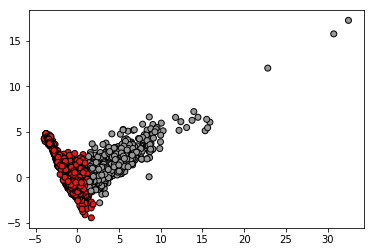

In [138]:
plt.scatter(Projected_data[:,0], Projected_data[:,1], c=kmeans_pca.labels_, cmap=plt.cm.Set1, edgecolors='k')

### Hierarchical With PCA

In [139]:
agglo_model_pca = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')

In [140]:
agglo_model_pca.fit(Projected_data)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=2,
                        pooling_func='deprecated')

In [141]:
agglo_model_pca.labels_

array([1, 0, 1, ..., 1, 0, 0], dtype=int64)

In [142]:
np.unique(agglo_model_pca.labels_,return_counts=True)

(array([0, 1], dtype=int64), array([11088,  1117], dtype=int64))

In [143]:
dataframe_scaled.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
0,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,-1.239776,-0.794017,-0.896370,-0.765321,0.401315,-0.553088
1,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.595451,-0.450137,1.268054,-0.318962,-0.31024,-1.334491,-0.136980,-0.209237,-0.896370,-0.516347,0.401315,-0.553088
2,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,2.068612,-0.794017,2.433853,-0.267374,0.401315,-0.553088
3,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.627404,0.654748,2.134590,-0.318962,-0.31024,-1.334491,0.965816,-0.209237,-0.480092,-0.018400,0.401315,-0.553088
4,-0.702302,-0.460019,-0.398824,-0.246257,-0.494387,-0.301889,-0.008183,0.184884,-0.318962,-0.31024,-1.334491,0.965816,0.375543,-0.896370,-0.018400,0.401315,1.808031


In [144]:
pca_agglo = dataframe_scaled.copy()

In [145]:
pca_agglo['Label'] = agglo_model_pca.labels_

In [146]:
df_clust = pca_agglo.groupby(['Label'])

In [147]:
df0 = df_clust.get_group(0)
df1 = df_clust.get_group(1)
print(df0.shape)
print(df1.shape)

(11088, 18)
(1117, 18)


In [148]:
pca_agglo.shape

(12205, 18)

In [149]:
c0 = np.mean(df0.iloc[:,0:18]).values
c0

array([ 0.06690413,  0.04413712,  0.03798554,  0.02452237,  0.06139337,
        0.05561729, -0.27272058, -0.26166848,  0.03213211, -0.01816371,
        0.00386387, -0.01245776,  0.00188109, -0.00104243, -0.0467151 ,
       -0.031296  ,  0.0165362 ,  0.        ])

In [150]:
c1 = np.mean(df1.iloc[:,0:18]).values
c1

array([-0.66412976, -0.43813106, -0.37706685, -0.24342348, -0.60942674,
       -0.55208999,  2.70718516,  2.59747548, -0.31896229,  0.18030371,
       -0.03835508,  0.12366309, -0.0186728 ,  0.01034781,  0.46372157,
        0.31066252, -0.16414807,  1.        ])

In [151]:
id0 = 0
id1 = 0 

In [152]:
for i in range(0, len(df0)):
    id0 = id0 + np.sum((df0.iloc[i:i+1,0:18].values - c0)**2)
for i in range(0, len(df1)):
    id1 = id1 + np.sum((df1.iloc[i:i+1,0:18].values - c1)**2)
print(id0)
print(id1)
print('Inertia for the AgglomerativeClustering with PCA is',id0+id1)

174975.45673850834
12743.245170717177
Inertia for the AgglomerativeClustering with PCA is 187718.70190922552


In [153]:
Agglo_pca_cent = pd.DataFrame([c0,c1])

In [154]:
Agglo_pca_cent

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.066904,0.044137,0.037986,0.024522,0.061393,0.055617,-0.272721,-0.261668,0.032132,-0.018164,0.003864,-0.012458,0.001881,-0.001042,-0.046715,-0.031296,0.016536,0.0
1,-0.664130,-0.438131,-0.377067,-0.243423,-0.609427,-0.552090,2.707185,2.597475,-0.318962,0.180304,-0.038355,0.123663,-0.018673,0.010348,0.463722,0.310663,-0.164148,1.0


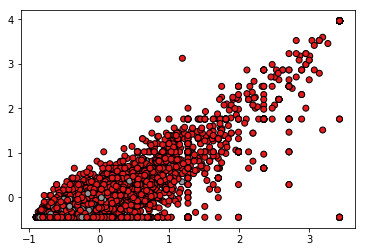

In [155]:
plt.scatter(pca_agglo['ExitRates'], pca_agglo['BounceRates'], c=kmeans_pca.labels_, cmap=plt.cm.Set1, edgecolors='k')

# 6. Data Split:

In [156]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BaseNB
from sklearn.tree import DecisionTreeClassifier

In [157]:
from sklearn.preprocessing import StandardScaler

In [158]:
without_pca = StandardScaler()

In [159]:
without_pca = without_pca.fit_transform(dataframe)

In [160]:
without_pca = pd.DataFrame(without_pca, columns=dataframe.columns)

In [161]:
without_pca = without_pca.join(df_labels_kmean)

In [162]:
without_pca.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,labels
0,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,-1.239776,-0.794017,-0.896370,-0.765321,0.401315,-0.553088,0
1,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.595451,-0.450137,1.268054,-0.318962,-0.31024,-1.334491,-0.136980,-0.209237,-0.896370,-0.516347,0.401315,-0.553088,0
2,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,2.068612,-0.794017,2.433853,-0.267374,0.401315,-0.553088,0
3,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.627404,0.654748,2.134590,-0.318962,-0.31024,-1.334491,0.965816,-0.209237,-0.480092,-0.018400,0.401315,-0.553088,0
4,-0.702302,-0.460019,-0.398824,-0.246257,-0.494387,-0.301889,-0.008183,0.184884,-0.318962,-0.31024,-1.334491,0.965816,0.375543,-0.896370,-0.018400,0.401315,1.808031,0


In [163]:
x = without_pca.drop('labels', axis=1)
y = without_pca['labels']

In [164]:
x.shape, y.shape

((12205, 17), (12205,))

In [165]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [166]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((8177, 17), (8177,), (4028, 17), (4028,))

In [167]:
print(y_test.shape)

(4028,)


In [168]:
log = LogisticRegression()

In [169]:
log.fit(x_train, y_train)

D:\program\python\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [170]:
pridict = log.predict(x_test)

In [171]:
from sklearn.metrics import confusion_matrix

In [172]:
confusion_matrix(y_test, pridict)

array([[3388,    6],
       [   4,  630]], dtype=int64)

In [173]:
log.score(x_test, y_test)

0.9975173783515392

In [174]:
# Decision Tree

In [175]:
dt = DecisionTreeClassifier()

In [176]:
dt.fit(x_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [177]:
pridict = dt.predict(x_test)

In [178]:
from sklearn.metrics import confusion_matrix

In [179]:
confusion_matrix(y_test, pridict)

array([[3333,   61],
       [  49,  585]], dtype=int64)

In [180]:
dt.score(x_test, y_test)

0.9726911618669315

In [181]:
# KNN

In [182]:
kn = KNeighborsClassifier()

In [183]:
kn.fit(x_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [184]:
pridict = kn.predict(x_test)

In [185]:
from sklearn.metrics import confusion_matrix

In [186]:
confusion_matrix(y_test, pridict)

array([[3382,   12],
       [ 114,  520]], dtype=int64)

In [187]:
kn.score(x_test, y_test)

0.9687189672293942

# 7. Split train and test

In [188]:
with_pca = StandardScaler()

In [189]:
with_pca = with_pca.fit_transform(dataframe)

In [190]:
with_pca = pd.DataFrame(with_pca, columns=dataframe.columns)

In [191]:
# with_pca = without_pca.join(df_labels_kmean)
with_pca['lab'] = kmeans_pca.labels_

In [192]:
without_pca.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,labels
0,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,-1.239776,-0.794017,-0.896370,-0.765321,0.401315,-0.553088,0
1,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.595451,-0.450137,1.268054,-0.318962,-0.31024,-1.334491,-0.136980,-0.209237,-0.896370,-0.516347,0.401315,-0.553088,0
2,-0.702302,-0.460019,-0.398824,-0.246257,-0.696218,-0.628793,3.969402,3.434394,-0.318962,-0.31024,-1.334491,2.068612,-0.794017,2.433853,-0.267374,0.401315,-0.553088,0
3,-0.702302,-0.460019,-0.398824,-0.246257,-0.673793,-0.627404,0.654748,2.134590,-0.318962,-0.31024,-1.334491,0.965816,-0.209237,-0.480092,-0.018400,0.401315,-0.553088,0
4,-0.702302,-0.460019,-0.398824,-0.246257,-0.494387,-0.301889,-0.008183,0.184884,-0.318962,-0.31024,-1.334491,0.965816,0.375543,-0.896370,-0.018400,0.401315,1.808031,0


In [193]:
x = with_pca.drop('lab', axis=1)
y = with_pca['lab']

In [194]:
x.shape, y.shape

((12205, 17), (12205,))

In [195]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [196]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((8177, 17), (8177,), (4028, 17), (4028,))

In [197]:
print(y_test.shape)

(4028,)


In [198]:
log = LogisticRegression()

In [199]:
log.fit(x_train, y_train)

D:\program\python\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [200]:
pridict = log.predict(x_test)

In [201]:
from sklearn.metrics import confusion_matrix

In [202]:
confusion_matrix(y_test, pridict)

array([[3416,    1],
       [   1,  610]], dtype=int64)

In [203]:
log.score(x_test, y_test)

0.9995034756703078

In [204]:
# Decision tree

In [205]:
dt = DecisionTreeClassifier()

In [206]:
dt.fit(x_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [207]:
pridict = dt.predict(x_test)

In [208]:
from sklearn.metrics import confusion_matrix

In [209]:
confusion_matrix(y_test, pridict)

array([[3349,   68],
       [  57,  554]], dtype=int64)

In [210]:
dt.score(x_test, y_test)

0.9689672293942403

In [211]:
# KNN

In [212]:
kn = KNeighborsClassifier()

In [213]:
kn.fit(x_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [214]:
pridict = kn.predict(x_test)

In [215]:
from sklearn.metrics import confusion_matrix

In [216]:
confusion_matrix(y_test, pridict)

array([[3404,   13],
       [ 122,  489]], dtype=int64)

In [217]:
kn.score(x_test, y_test)

0.9664846077457795

# Final Model: